# This notebook is based on FAIR's (Facebook/Meta AI Research) latest [paper](https://arxiv.org/abs/2304.02643) on SAM - Segment Anything Model

## We will seek to build a training script to train SAM from scratch for segmentation tasks on custom datasets.
We will only fine-tune weights for the mask decoder module and not for the vision or prompt encoder since they will act as good feature extraction modules

## Let's get started

## First let's install some basic dependencies

In [21]:
%%bash
pip install git+https://github.com/huggingface/transformers.git
pip install -q datasets
pip install -q monai

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-5jrsij56


  Running command git clone -q https://github.com/huggingface/transformers.git /tmp/pip-req-build-5jrsij56


  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for transformers: filename=transformers-4.31.0.dev0-py3-none-any.whl size=7170473 sha256=70b971af8dc5098cd3bf5cc30de706df6d8b1125b1bdf8f5c8ff3f3776591b0a
  Stored in directory: /tmp/pip-ephem-wheel-cache-nwz5lt7z/wheels/05/0a/97/64ae47c27ba95fae2cb5838e7b4b7247a34d4a8ba5f7092de2
Successfully built transformers


## Fetching and Setting up the DIS-5K dataset for Dichotomous Image Segmentation

In [4]:
!gdown "https://drive.google.com/uc?export=download&id=1jOC2zK0GowBvEt03B7dGugCRDVAoeIqq"

'gdown' is not recognized as an internal or external command,
operable program or batch file.


In [3]:
%%capture
!unzip DIS5K.zip

In [8]:
%%bash
ls "./DIS5K/DIS-TR/im" > image_list.txt

In [4]:
%%bash
ls "./DIS5K/DIS-VD/im" > image_list_test.txt

In [5]:
import csv

image_file = "image_list_test.txt"
output_file = "output_test.csv"

with open(image_file, 'r') as imf, open(output_file, "w") as opf:
  writer = csv.writer(opf)
  writer.writerow(["img_id"])
  for line in imf:
    img_file_name = line.strip()
    img_id = img_file_name[:-4]
    writer.writerow([img_id])

print("CSV File with img ids created successfully")

CSV File with img ids created successfully


## Some utility functions

In [1]:
import numpy as np

def get_bounding_box(ground_truth_mask):

  # get bounding box from mask
  y_indices, x_indices = np.where(ground_truth_mask > 0)
  # left and right extremes of the mask
  x_min, x_max = np.min(x_indices), np.max(x_indices)
  # top and bottom extremes of the mask
  y_min, y_max = np.min(y_indices), np.max(y_indices)

  H, W = ground_truth_mask.shape

  # adding some randomness so that the bounding boxes are not precisely glued to the
  # mask edges
  # We also need to make sure that it remains within the image
  x_min = max(0, x_min - np.random.randint(0, 20))
  x_max = min(W, x_max + np.random.randint(0, 20))
  y_min = max(0, y_min - np.random.randint(0, 20))
  y_max = min(H, y_max + np.random.randint(0, 20))

  bbox = [x_min, y_min, x_max, y_max]

  return bbox

In [649]:
import matplotlib.pyplot as plt
import numpy as np

def show_mask(mask, ax, random_color=False):
  if random_color:
    color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
  else:
    color = np.array([25/255, 125/255, 75/255, 0.6])
  h, w = mask.shape[-2:]
  mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

  ax.imshow(mask_image)

## Let's now create a custom dataset class that we can use to train the model

We need to note that for the SAM model, each data instance must have:<br>
* Pixel values (image)
* A prompt (bounding box for area to segment)
* A ground truth segmentation mask (for training)

<br>
Now ofcourse the training process might be for huge datasets, and for such segmentation datasets we generally only have the image and the segmentation mask.<br><br>
We do not generally have a prompt associated as this is a nove technique.
However, since we have the ground truth masks, we can easily generate prompt bounding boxes on the fly.<br><br>
Do note that prompts can be anything from bounding boxes to points, text or rudimentary masks. We're using bounding boxes here because it can be generated on the fly from the ground truth masks we already have (unlike text), and because it makes good semantic sense for segmentation tasks

In [3]:
train_img_dir = "./DIS5K/DIS-TR/im/"
train_masks_dir = "./DIS5K/DIS-TR/gt/"
test_img_dir = "./DIS5K/DIS-VD/im/"
test_masks_dir = "./DIS5K/DIS-VD/gt/"

In [4]:
import torch
from torch.utils.data import Dataset
import pandas as pd
import transformers
from PIL import Image
import warnings
from torchvision import transforms
warnings.simplefilter('error', Image.DecompressionBombWarning)

class DIS5KDataset(Dataset):
  def __init__(
      self,
      data_csv: str,
      train_img_dir: str,
      train_masks_dir: str,
      processor: transformers.SamProcessor,
      frac: float=1.0
      ):
    self.df = pd.read_csv(data_csv)
    self.df = self.df.sample(frac=frac)
    self.train_img_dir = train_img_dir
    self.train_masks_dir = train_masks_dir
    self.processor = processor
    self.frac = frac

  def __len__(self):
    return len(self.df)

  def __getitem__(self, idx):
    img_id = self.df.iloc[idx, 0]
    img_path = str(self.train_img_dir + img_id + ".jpg")
    mask_path = str(self.train_masks_dir + img_id + ".png")
    
    try:
      img = Image.open(img_path)
    except Image.DecompressionBombWarning:
      with open('logs.txt', 'a') as f:
        f.write(str("\n" + img_path))
      return self[idx+1]
  
    

    transforms_list = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((1024, 1024), antialias=False)
    ])
    img = transforms_list(img)
    img = (img * 255).to(torch.uint8)  # SamProcessor expects uint8 images
    
    try:
      mask = Image.open(mask_path)
    except Image.DecompressionBombWarning:
      with open('logs.txt', 'a') as f:
        f.write(str("\n" + mask_path))
      return self[idx+1]
    mask = np.array(mask)
    mask = transforms_list(mask).squeeze(0)
    
    # get bounding box prompt
    prompt = get_bounding_box(mask)

    inputs = self.processor(img, input_boxes=[[prompt]], return_tensors="pt")
    inputs = {k: v.squeeze(0) for k, v in inputs.items()}


    inputs["ground_truth_mask"] = mask

    return inputs



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## Setting up the processor to transform inputs and prompts for SAM

In [6]:
from transformers import SamProcessor

processor = SamProcessor.from_pretrained("facebook/sam-vit-base")
processor.image_processor.do_normalize = False  # we'll train with non-normalized images
processor.image_processor.do_normalize

False

## Now let's instantiate the dataset with our custom dataset class and the trainloaders and verify the state and shape of the data

In [7]:
train_dataset = DIS5KDataset(
    data_csv="output.csv",
    train_img_dir=train_img_dir,
    train_masks_dir=train_masks_dir,
    processor=processor
)

In [8]:
test_dataset = DIS5KDataset(
    "output_test.csv",
    test_img_dir,
    test_masks_dir,
    processor=processor
)

In [9]:
len(train_dataset)

3000

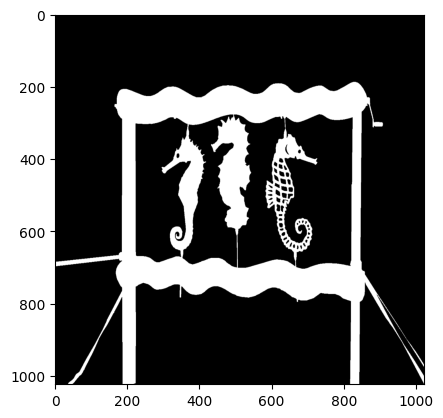

In [10]:
plt.imshow(train_dataset[3]["ground_truth_mask"], cmap="gray")

In [11]:
example = train_dataset[0]
for k, v in example.items():
  print(k, v.shape)

print(example["original_sizes"], example["reshaped_input_sizes"])

pixel_values torch.Size([3, 1024, 1024])
original_sizes torch.Size([2])
reshaped_input_sizes torch.Size([2])
input_boxes torch.Size([1, 4])
ground_truth_mask torch.Size([1024, 1024])
tensor([1024, 1024]) tensor([1024, 1024])


In [12]:
len(test_dataset)

470

In [13]:
example = test_dataset[0]
for k, v in example.items():
  print(k, v.shape)

print(example["original_sizes"], example["reshaped_input_sizes"])

pixel_values torch.Size([3, 1024, 1024])
original_sizes torch.Size([2])
reshaped_input_sizes torch.Size([2])
input_boxes torch.Size([1, 4])
ground_truth_mask torch.Size([1024, 1024])
tensor([1024, 1024]) tensor([1024, 1024])


## Defining the DataLoaders

In [14]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=True)

In [15]:
batch = next(iter(train_dataloader))
for k, v in batch.items():
  print(k, v.shape)
print(batch["original_sizes"], batch["reshaped_input_sizes"])

pixel_values torch.Size([2, 3, 1024, 1024])
original_sizes torch.Size([2, 2])
reshaped_input_sizes torch.Size([2, 2])
input_boxes torch.Size([2, 1, 4])
ground_truth_mask torch.Size([2, 1024, 1024])
tensor([[1024, 1024],
        [1024, 1024]]) tensor([[1024, 1024],
        [1024, 1024]])


In [16]:
batch = next(iter(test_dataloader))
for k, v in batch.items():
  print(k, v.shape)
print(batch["original_sizes"], batch["reshaped_input_sizes"])

pixel_values torch.Size([2, 3, 1024, 1024])
original_sizes torch.Size([2, 2])
reshaped_input_sizes torch.Size([2, 2])
input_boxes torch.Size([2, 1, 4])
ground_truth_mask torch.Size([2, 1024, 1024])
tensor([[1024, 1024],
        [1024, 1024]]) tensor([[1024, 1024],
        [1024, 1024]])


## Load the model

In [17]:
from transformers import SamModel

model = SamModel.from_pretrained("facebook/sam-vit-base")

In [18]:
# make sure we only compute gradients for the mask decoder and not the vision encoder
# or the text encoder as these are rich pretrained modules which will serve as powerful
# feature extractors

for name, param in model.named_parameters():
  if name.startswith("vision_encoder") or name.startswith("prompt_encoder"):
    param.requires_grad_(False)  # setting the grad compute to false
    # this will ensure the weights are not updated for these params

## Setting up Tensorboard for monitoring

In [19]:
%load_ext tensorboard

In [20]:
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter("runs/sam_training")

In [ ]:
from torch import nn

class SAMGraphModel(nn.Module):
  def __init__(self, model):
    super(SAMGraphModel, self).__init__()
    self.model = model

  def forward(self, pixel_values, input_boxes):
    outputs = self.model(pixel_values=pixel_values, input_boxes=input_boxes)
    logits = outputs.pred_masks

    return logits

batch = train_dataset[0]
sam_graph_model = SAMGraphModel(model)
writer.add_graph(sam_graph_model, (batch["pixel_values"].unsqueeze(0), batch["input_boxes"].unsqueeze(0)))

In [22]:
%tensorboard --logdir="runs/sam_training" --port=6006

Reusing TensorBoard on port 6006 (pid 9792), started 10 days, 2:02:22 ago. (Use '!kill 9792' to kill it.)

## Finally, now, we're ready to train the model
## Let's begin!

### Setting up the hparams and training parameters

In [23]:
import torch
from torch import nn
from torch.optim import Adam
import monai  # for custom loss function

# Note how we instantiate the optimizer only for the mask decoder
# this is because we're only updating the weights of the decoder for training on
# the segmentation tasks and leaving the encoders untouched as fine feature extractors
optimizer = Adam(model.mask_decoder.parameters(), lr=5e-5, weight_decay=0)
num_epochs = 10
grad_update_batch_size = 8
# seg_loss = monai.losses.DiceCELoss(sigmoid=True, squared_pred=True, reduction="mean")
num_training_steps = num_epochs * len(train_dataloader)
criterion = nn.BCEWithLogitsLoss(reduction="mean")
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [29]:
train_dataset[1]["pixel_values"].dtype

torch.float32

### Training loop!

In [30]:
import torch
import torch.nn.functional as functional
from tqdm import tqdm
from statistics import mean

model.to(device)


for epoch in range(num_epochs):

  # train
  looper_train = tqdm(train_dataloader, leave=True)
  epoch_loss = 0
  model.train()
  for i, batch in enumerate(looper_train):
    batch = {k: v.to(device) for k, v in batch.items()}
    outputs = model(
        pixel_values=batch["pixel_values"],
        input_boxes=batch["input_boxes"],
        multimask_output=False
    )

    # loss
    pred_masks = outputs.pred_masks.squeeze(1)
    pred_masks = functional.interpolate(
      pred_masks,
      size=(1024, 1024),
      mode='bilinear',
      align_corners=False
    )
    pred_masks = pred_masks.squeeze(1)
    
    ground_truth_masks = batch["ground_truth_mask"].float()
    loss = criterion(pred_masks, ground_truth_masks) / grad_update_batch_size

    # loss = seg_loss(pred_masks, ground_truth_masks.unsqueeze(1))

    # backprop
    loss.backward()

    # update weights at 'grad_update_batch_size' intervals
    # using gradient accumulation
    if (i+1) % grad_update_batch_size == 0:
      optimizer.step()
      optimizer.zero_grad()

    # update mean epoch loss
    if i == 0:
      epoch_loss = loss
    else:
      epoch_loss_cum = epoch_loss * (i)
      epoch_loss_cum = epoch_loss_cum + loss
      epoch_loss = epoch_loss_cum / (i + 1)
    
    # save model
    if i % 100 == 0:
      save_path = f"./custom_sam_dev_revised_{epoch}.pt"
      torch.save(model, save_path)

    # progress bar update
    looper_train.set_description(f"Epoch: {epoch}\t Train Loss: {epoch_loss}")

    # update tensorboard logging
    writer.add_scalar("training_loss_DIS5k_gradup8_v1", loss.item(), epoch*len(train_dataloader) + i + 1)
  

  # test
  looper_test = tqdm(test_dataloader, leave=True)
  epoch_loss = 0
  model.eval()
  for i, batch in enumerate(looper_test):
    batch = {k: v.to(device) for k, v in batch.items()}
    with torch.no_grad():
      outputs = model(
        pixel_values=batch["pixel_values"],
        input_boxes=batch["input_boxes"],
        multimask_output=False
      )

    # loss
    pred_masks = outputs.pred_masks.squeeze(1)
    pred_masks = functional.interpolate(
      pred_masks,
      size=(1024, 1024),
      mode='bilinear',
      align_corners=False
    )
    pred_masks = pred_masks.squeeze(1)
    
    ground_truth_masks = batch["ground_truth_mask"].float()
    loss = criterion(pred_masks, ground_truth_masks) / grad_update_batch_size

    # update mean epoch loss
    if i == 0:
      epoch_loss = loss
    else:
      epoch_loss_cum = epoch_loss * (i)
      epoch_loss_cum = epoch_loss_cum + loss
      epoch_loss = epoch_loss_cum / (i + 1)

    # progress bar update
    looper_test.set_description(f"Epoch: {epoch}\t Test Loss: {epoch_loss}")

    # update tensorboard logging
    writer.add_scalar("test_loss_DIS5k_gradup8_v1", loss.item(), epoch*len(test_dataloader) + i + 1)
    

Epoch: 9	 Test Loss: 0.015543332323431969: 100%|██████████| 235/235 [03:30<00:00,  1.12it/s]


### Examining Decompression-Bomb-Like Images

In [ ]:
from PIL import Image
img = Image.open("DIS5K/DIS-TR/im/16#Music Instrument#2#Harp#48704995783_34fb60aa94_o.jpg")


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (101824320 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


### Saving the model

In [42]:
torch.save(model, "./custom_sam_dev.pt")

In [ ]:
!cp -r "/content/custom_sam.pt" "/content/drive/MyDrive/Research"

## Inference

In [ ]:
!pip install transformers -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 43.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 123.3 MB/s eta 0:00:00


In [23]:
import torch
from torch import nn
import transformers
import numpy as np
from PIL import Image
from transformers import SamProcessor

In [528]:
DEVICE = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model = torch.load("./custom_sam_dev_revised_6.pt", map_location=DEVICE)
# model = SamModel.from_pretrained("facebook/sam-vit-base")
processor = SamProcessor.from_pretrained("facebook/sam-vit-base", do_normalize=False)
model.to(DEVICE)

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNorm()
     

In [25]:
next(iter(train_dataloader))["ground_truth_mask"].shape

torch.Size([2, 1024, 1024])

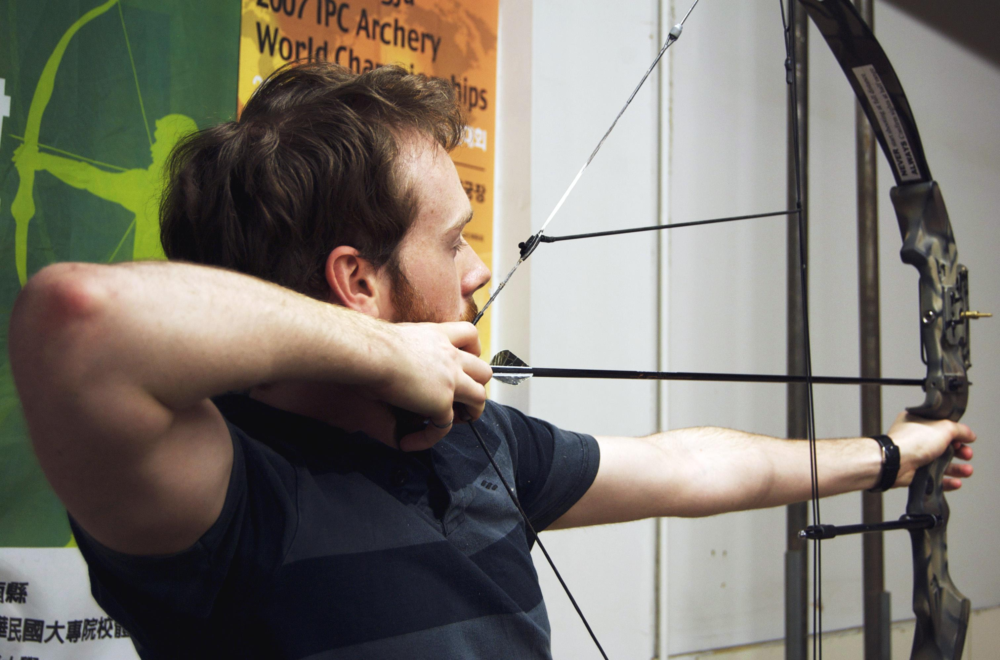

In [616]:
import random
# image = Image.open("./DIS5K/DIS-TR/im/1#Accessories#2#Clothes#2202083087_a2693858dd_o.jpg")
# gt = Image.open("./DIS5K/DIS-TR/gt/1#Accessories#2#Clothes#2202083087_a2693858dd_o.png")
# image = Image.open("./DIS5K/DIS-TR/im/1#Accessories#1#Bag#3660693333_61004a731d_o.jpg")
# gt = Image.open("./DIS5K/DIS-TR/gt/1#Accessories#1#Bag#3660693333_61004a731d_o.png")
rand = random.randint(0, 3000)
path = train_dataset.df.iloc[rand].img_id
image = Image.open(str("./DIS5K/DIS-TR/im/" + path + ".jpg"))
gt = Image.open(str("./DIS5K/DIS-TR/gt/" + path + ".png"))
image

In [617]:
image1 = np.array(image)
image1.shape

(1998, 3024, 3)

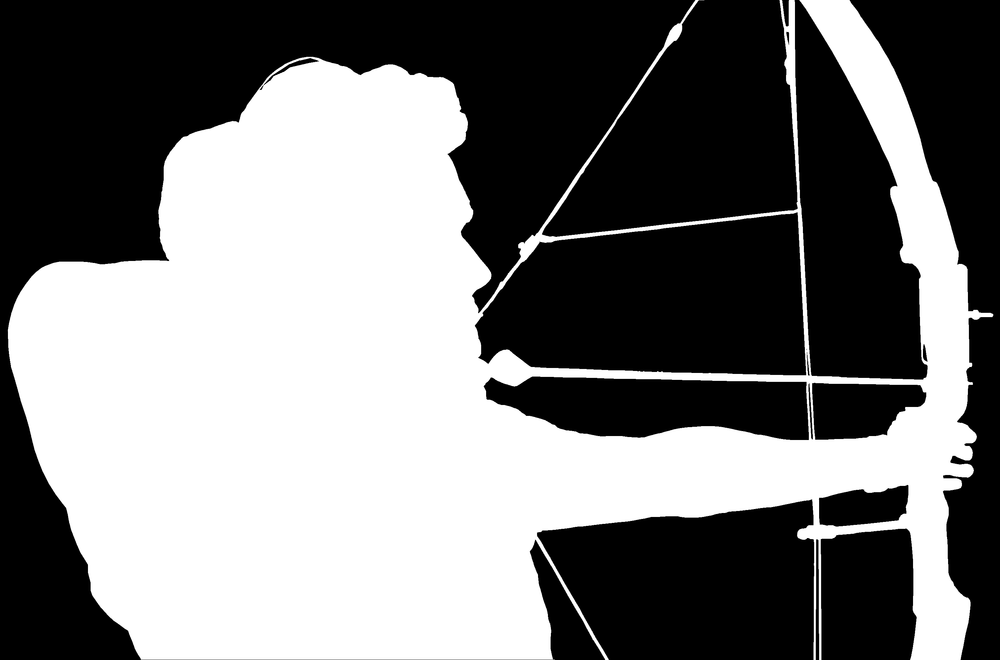

In [618]:
gt

In [619]:
gt1 = np.array(gt)
orig_size = gt1.shape
gt1.shape

(1998, 3024)

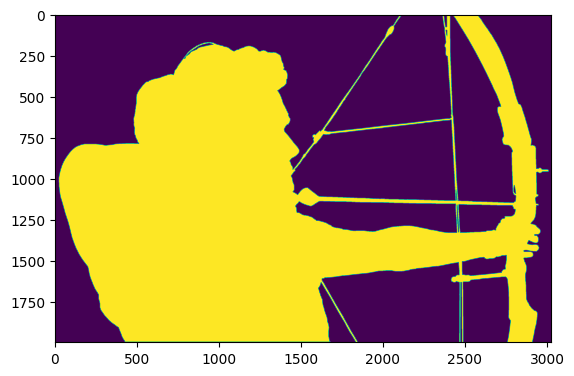

In [620]:
import matplotlib.pyplot as plt
plt.imshow(gt1)

In [621]:
processor.image_processor.do_normalize = True
processor.image_processor.do_normalize

True

In [622]:
image1 = nn.functional.interpolate(
    torch.tensor(image1).permute(2, 0, 1).unsqueeze(0),
    size=(1024, 1024),
    mode='bilinear',
    align_corners=False
).squeeze(0).permute(1, 2, 0)
gt1 = nn.functional.interpolate(
    torch.tensor(gt1).unsqueeze(0).unsqueeze(0),
    size=(1024, 1024),
    mode='bilinear',
    align_corners=False
).squeeze(0).squeeze(0)

In [623]:
DEVICE = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [ ]:
image1 = torch.tensor(image1).permute(2, 0, 1)

In [625]:
image1.shape

torch.Size([3, 1024, 1024])

In [626]:
image1.dtype

torch.uint8

In [627]:
prompt = get_bounding_box(gt1)
inputs = processor(image1, input_boxes=[[prompt]], return_tensors="pt").to(DEVICE)
for k, v in inputs.items():
  print(k, v.shape)

pixel_values torch.Size([1, 3, 1024, 1024])
original_sizes torch.Size([1, 2])
reshaped_input_sizes torch.Size([1, 2])
input_boxes torch.Size([1, 1, 4])


In [628]:
inputs["reshaped_input_sizes"]

tensor([[1024, 1024]], device='cuda:0')

In [629]:
inputs["input_boxes"]

tensor([[[   0.,    0., 1024., 1024.]]], device='cuda:0', dtype=torch.float64)

[   0    0 1024 1024]
(1024, 1024, 3)


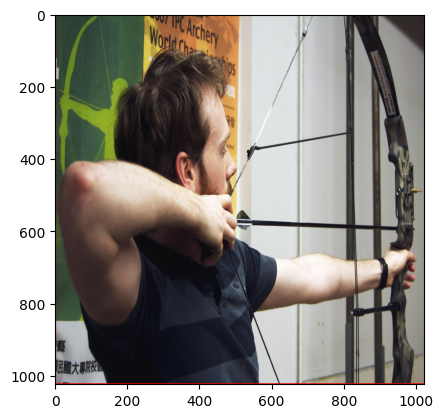

In [630]:
import cv2
bbox = inputs["input_boxes"][0][0].cpu().numpy().astype(np.uint16)
print(bbox)
img_show = np.array(image1.permute(1, 2, 0)).copy()
print(img_show.shape)
img_show = cv2.rectangle(img_show, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (255, 0, 0), 4)
plt.imshow(img_show)

In [631]:
print(inputs["original_sizes"], inputs["reshaped_input_sizes"])

tensor([[1024, 1024]], device='cuda:0') tensor([[1024, 1024]], device='cuda:0')


In [632]:
inputs["pixel_values"]

tensor([[[[-1.3815, -1.3644, -1.4843,  ..., -1.3644, -1.3473, -1.3473],
          [-1.3815, -1.3130, -1.3987,  ..., -1.3473, -1.3130, -1.3473],
          [-1.3130, -1.3302, -1.4158,  ..., -1.3473, -1.3130, -1.3130],
          ...,
          [-0.5424, -0.0629,  0.1426,  ...,  0.4166,  0.4166,  0.3823],
          [-0.2342,  0.1597,  0.1597,  ...,  0.3652,  0.3823,  0.3481],
          [-0.0116,  0.1083, -0.0972,  ...,  0.3652,  0.3823,  0.3481]],

         [[-0.9678, -0.9503, -1.0728,  ..., -1.3354, -1.3179, -1.3179],
          [-0.9678, -0.8978, -0.9853,  ..., -1.3179, -1.2829, -1.3179],
          [-0.8978, -0.9153, -1.0028,  ..., -1.3179, -1.2829, -1.2829],
          ...,
          [-0.4251,  0.0651,  0.3277,  ...,  0.3978,  0.3978,  0.3627],
          [-0.1099,  0.2927,  0.3452,  ...,  0.3452,  0.3627,  0.3277],
          [ 0.1176,  0.2402,  0.0826,  ...,  0.3452,  0.3627,  0.3277]],

         [[-1.0201, -0.9678, -1.0898,  ..., -1.1247, -1.1073, -1.1073],
          [-1.0201, -0.9156, -

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


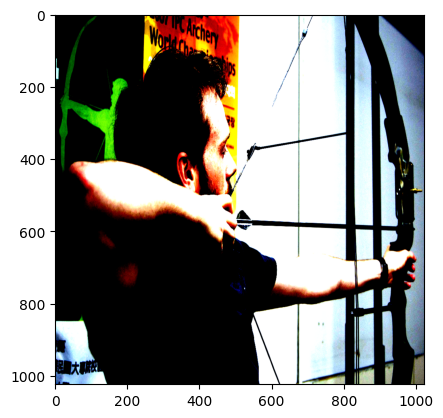

In [633]:
plt.imshow(np.array(inputs["pixel_values"].squeeze(0).cpu().permute(1, 2, 0)))

In [671]:
%%timeit
model.eval()

with torch.no_grad():
  outputs = model(**inputs, multimask_output=False)

172 ms ± 3.56 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [635]:
outputs

SamImageSegmentationOutput(iou_scores=tensor([[[0.9978]]], device='cuda:0'), pred_masks=tensor([[[[[-4.7861, -4.8318, -5.0793,  ..., -5.5005, -5.5369, -5.2714],
           [-4.7586, -5.8746, -5.5828,  ..., -5.8629, -5.6953, -5.3499],
           [-5.3629, -6.0897, -5.4729,  ..., -5.8814, -5.8466, -5.1209],
           ...,
           [-2.6849, -4.0073, -3.5999,  ..., -4.6211, -3.6659, -4.0324],
           [-1.5375, -4.1462, -1.6459,  ..., -3.8238, -3.8627, -2.7991],
           [-1.5205, -2.8990, -0.7621,  ..., -3.9901, -2.9355, -3.7932]]]]],
       device='cuda:0'), vision_hidden_states=None, vision_attentions=None, mask_decoder_attentions=None)

In [636]:
outputs["pred_masks"].shape

torch.Size([1, 1, 1, 256, 256])

In [637]:
std_size = (1024, 1024)
pred_masks_1 = nn.functional.interpolate(
    outputs["pred_masks"].squeeze(1),
    size=orig_size,
    mode='bilinear',
    align_corners=False
)
pred_masks_1.shape

torch.Size([1, 1, 1998, 3024])

In [638]:
sam_seg_prob = torch.sigmoid(pred_masks_1)

sam_seg_prob = sam_seg_prob.cpu().numpy().squeeze()
sam_seg = (sam_seg_prob > 0.5).astype(np.uint8)

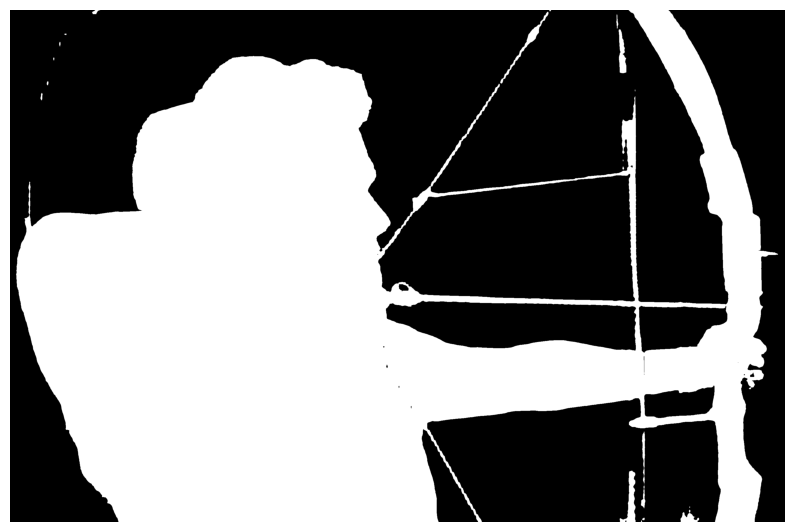

In [670]:
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.imshow(sam_seg, cmap="gray")

Text(0.5, 1.0, 'Ground Truth Mask')

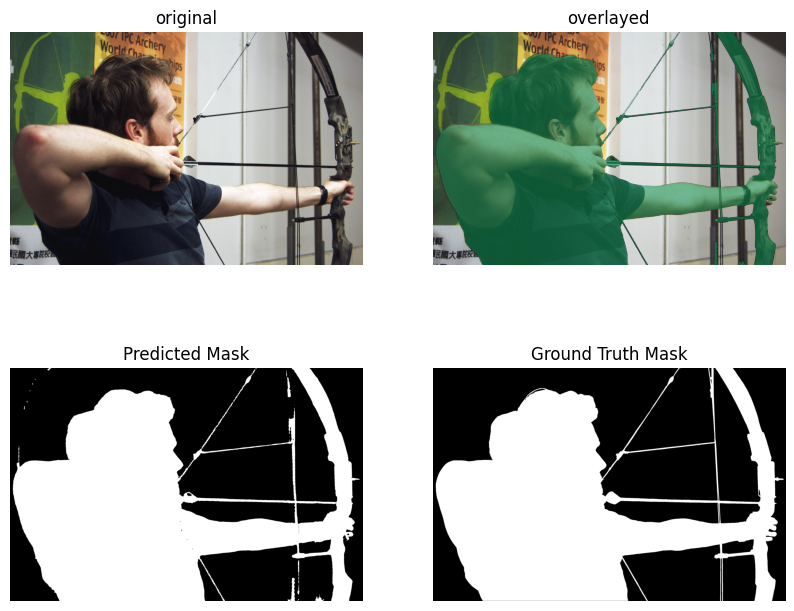

In [666]:
orig_image = np.array(image)
img_show = np.array(inputs["pixel_values"].squeeze(0).cpu().permute(1, 2, 0))
img_show = orig_image

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 8))

ax1.imshow(img_show)
ax1.axis("off")
ax1.set_title("original")

ax2.imshow(img_show)
show_mask(sam_seg, ax2, random_color=True)
ax2.axis("off")
ax2.set_title("overlayed")

ax3.imshow(sam_seg, cmap="gray")
ax3.axis("off")
ax3.set_title("Predicted Mask")

ax4.imshow(np.array(gt), cmap="gray")
ax4.axis("off")
ax4.set_title("Ground Truth Mask")

## Overlaying mask on image

(-0.5, 3023.5, 1997.5, -0.5)

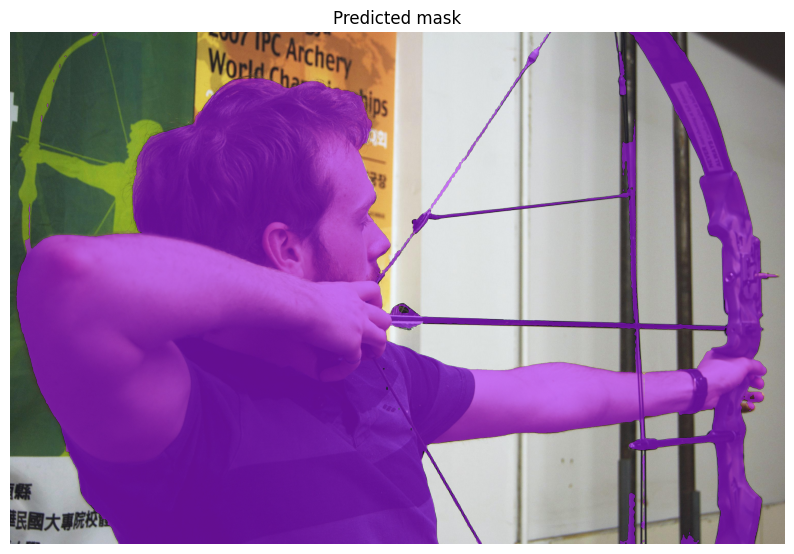

In [663]:
fig, axes = plt.subplots(figsize=(10,15))
# img_show = np.array(inputs["pixel_values"].squeeze(0).cpu().permute(1, 2, 0))
axes.imshow(img_show)
show_mask(sam_seg, axes, random_color=True)
axes.title.set_text(f"Predicted mask")
axes.axis("off")

## For further experimentation (WIP)

In [ ]:
gts = processor(torch.tensor(gt1).unsqueeze(0), input_boxes=[[prompt]], return_tensors="pt").to(DEVICE)
expim = processor(torch.tensor(image1), input_boxes=[[prompt]], return_tensors="pt").to(DEVICE)
for k, v in gts.items():
    print(k, v.shape)
print(gts["original_sizes"], gts["reshaped_input_sizes"])
plt.imshow(gts["pixel_values"].squeeze(0).squeeze(0).cpu(), cmap="gray")
plt.imshow(expim["pixel_values"].squeeze(0).permute(1, 2, 0).cpu())